# Advanced Lane Finding Steps

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Change color spaces, isolate color channel and combine with gradients to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
* Create a video using the output images.

In [1]:
# Necessary imports
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle
%matplotlib inline

## Camera calibration

In [2]:
# Loading camera calibration
cameraCalibration = pickle.load( open('./pdata/camera_calibration.p', 'rb' ) )
mtx, dist = map(cameraCalibration.get, ('mtx', 'dist'))

In [3]:
# Helper function to show Image
def show_image(image, figsize=(15,10), cmap=None):  
    plt.figure(figsize=(10, 11))
    plt.subplot(1, 1, 1)
    cmap = 'gray' if len(image.shape)==2 else cmap
    plt.imshow(image, cmap=cmap)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()
            
def show_images(images, cols = 2, rows = 2, figsize=(15,15), cmap = None):
    imageLength = len(images)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    indexes = range(cols * rows)
    for ax, index in zip(axes.flat, indexes):
        if index < imageLength:
            imagePathName, image = images[index]
            if cmap == None:
                ax.imshow(image)
            else:
                ax.imshow(image, cmap='gray')
            ax.axis('off')
            ax.set_title(imagePathName)

## Apply a distortion correction to raw images

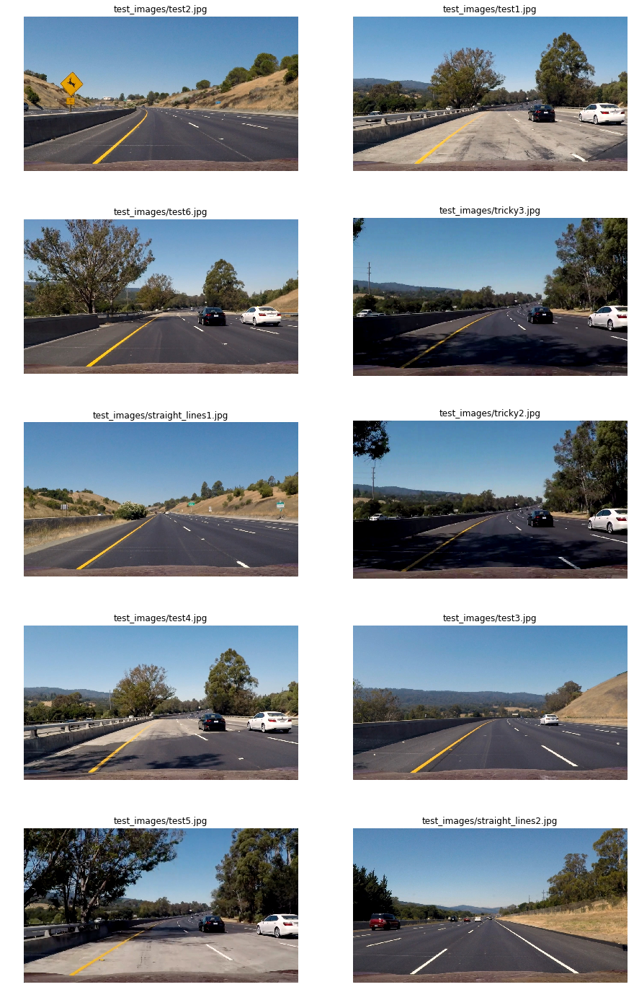

In [4]:
# Load images and show original test images
# Load with OpenCV (BGR format)
test_images = list(map(lambda imageFileName: (imageFileName, cv2.cvtColor(cv2.imread(imageFileName), cv2.COLOR_BGR2RGB)), 
                      glob.glob('test_images/*.jpg')))

# List map with using lambda functions
# http://www.u.arizona.edu/~erdmann/mse350/topics/list_comprehensions.html
show_images(list(map(lambda image: (image[0], image[1]),test_images)), 2, 5, (15, 25))

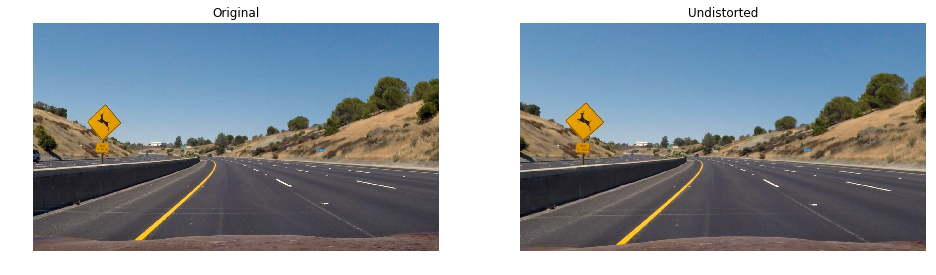

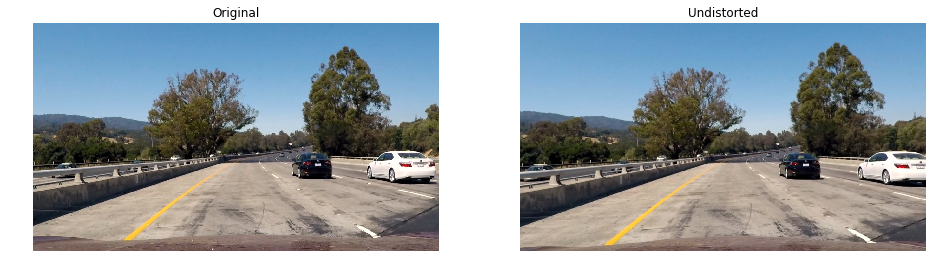

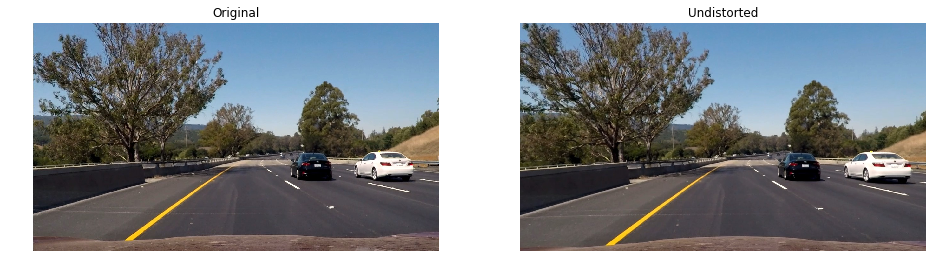

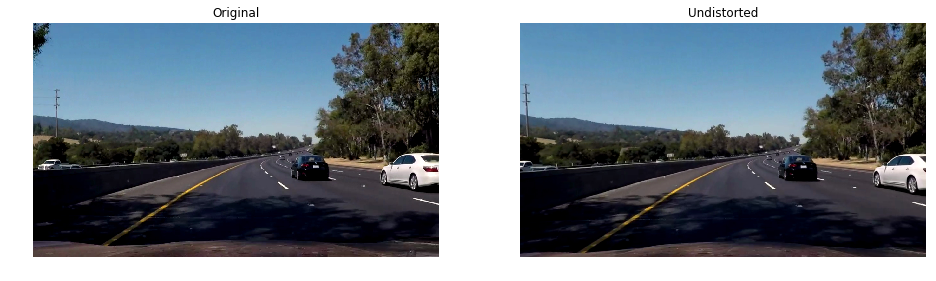

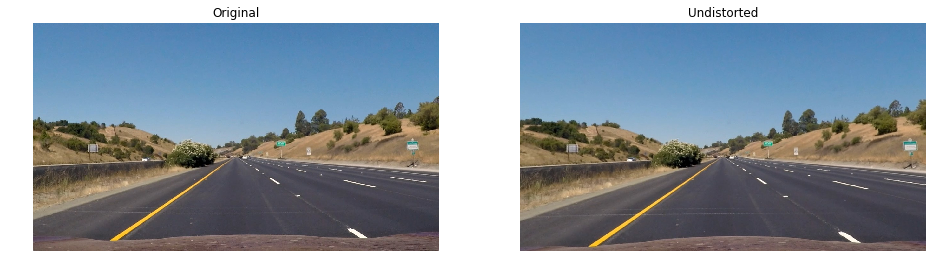

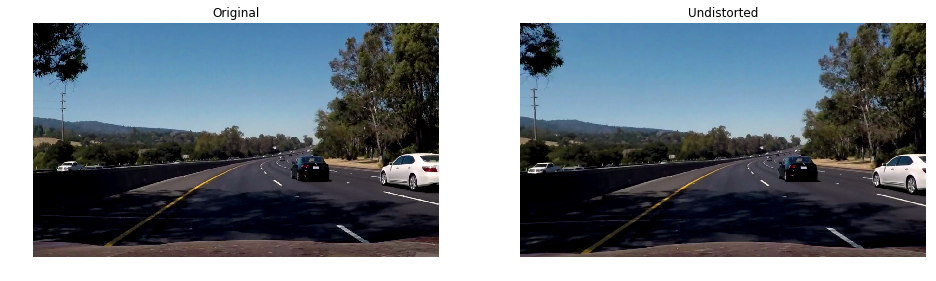

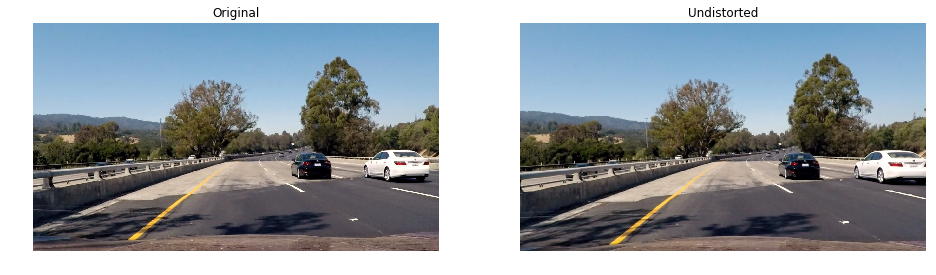

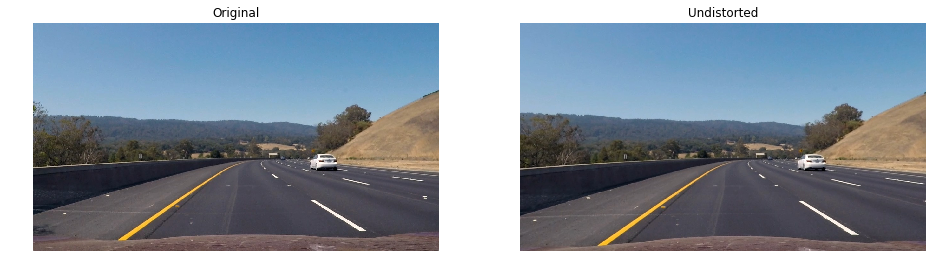

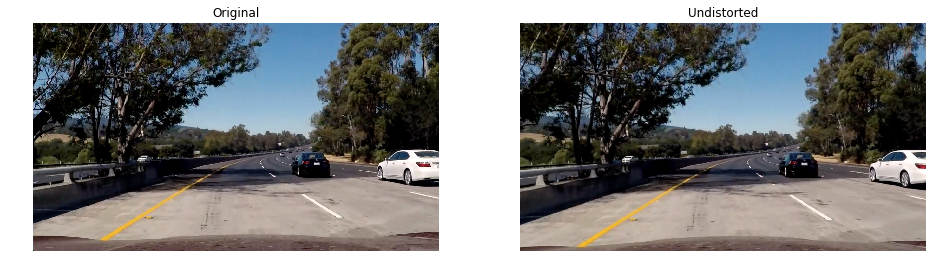

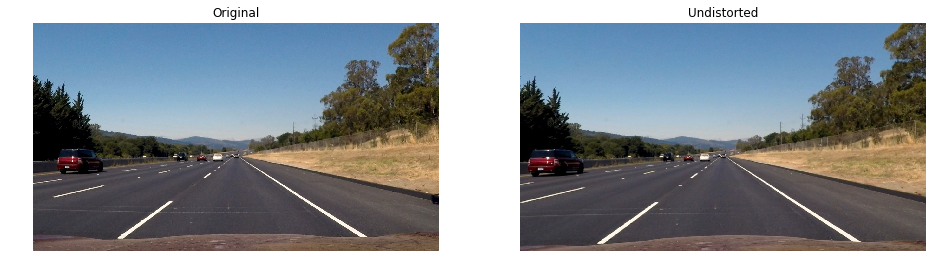

In [5]:
# Show original and undistorted image side by side
def show_compare_images(leftImg, leftTitle, rightImg, rightTitle, figsize=(16,10), cmap=None):
    fig, axes = plt.subplots(ncols=2, figsize=figsize)
    if cmap == None:
        axes[0].imshow(leftImg)
    else:
        axes[0].imshow(leftImg, cmap=cmap)
    axes[0].set_title(leftTitle)
    axes[0].axis('off')
    if cmap == None:
        axes[1].imshow(rightImg)
    else:
        axes[1].imshow(rightImg, cmap=cmap)
    axes[1].set_title(rightTitle)
    axes[1].axis('off')

for original in test_images:
    show_compare_images(
        original[1], 'Original',
        cv2.undistort(original[1], mtx, dist, None, mtx), 'Undistorted'
    )

## Change color spaces, isolate color channel and combine with gradients.

In [6]:
# Helper functions for list / map / lambda
def applyActionToImages(images, action):
    # Apply an action to test images
    return list(map(lambda image: (image[0], action(image[1])), images))

# Undistort BGR image
def undistort_image(image, mtx=mtx, dist=dist):
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    return undist

# Undistort RGB image
def undistort_image_and_convert_to_RGB(image, mtx=mtx, dist=dist):
    ouput = undistort_image(image, mtx, dist)
    return cv2.cvtColor(ouput, cv2.COLOR_BGR2RGB)

# Undistort image and convert to HLS colorspace
def undistort_image_and_convert_to_HLS(image, mtx=mtx, dist=dist):
    ouput = undistort_image(image, mtx, dist)
    return cv2.cvtColor(ouput, cv2.COLOR_RGB2HLS)

# Undistort image and convert to HSV colorspace
def undistort_image_and_convert_to_HSV(image, mtx=mtx, dist=dist):
    ouput = undistort_image(image, mtx, dist)
    return cv2.cvtColor(ouput, cv2.COLOR_RGB2HSV)

# Undistort image and convert to HSV colorspace
def undistort_image_and_convert_to_LAB(image, mtx=mtx, dist=dist):
    ouput = undistort_image(image, mtx, dist)
    return cv2.cvtColor(ouput, cv2.COLOR_RGB2LAB)

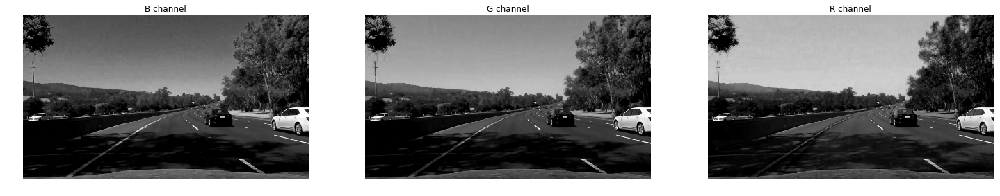

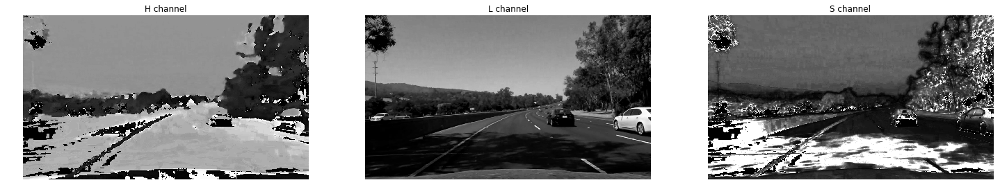

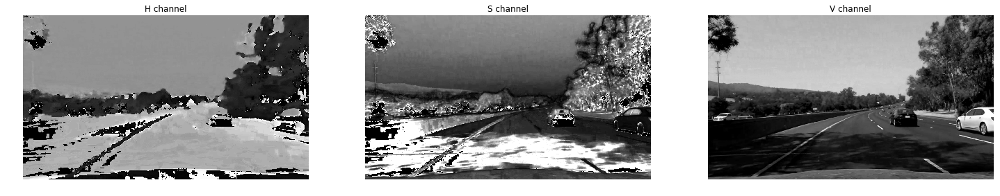

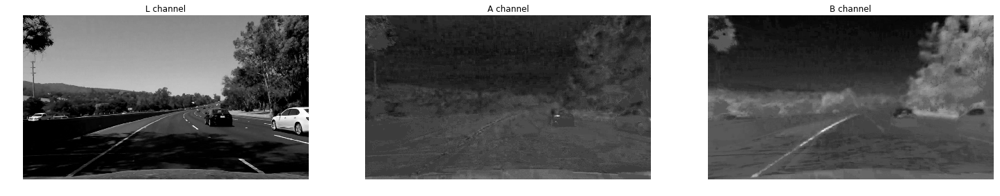

In [7]:
original = test_images[5][1]

# BGR Color channel
labels = ['B channel', 'G channel', 'R channel']
bgr_original = undistort_image(original)
fig, axes = plt.subplots(ncols=3, figsize=(25,10))
for index, a in enumerate(axes):
    a.imshow(bgr_original[:,:,index], cmap='gray')
    a.axis('off')
    a.set_title(labels[index])
    cv2.imwrite('images/example_BGR_' + labels[index] + '.png', bgr_original[:,:,index])

# HLS Color channel
labels = ['H channel', 'L channel', 'S channel']
hls_original = undistort_image_and_convert_to_HLS(original)
fig, axes = plt.subplots(ncols=3, figsize=(25,10))
for index, a in enumerate(axes):
    a.imshow(hls_original[:,:,index], cmap='gray')
    a.axis('off')
    a.set_title(labels[index])
    cv2.imwrite('images/example_HLS_' + labels[index] + '.png', hls_original[:,:,index])
    
# HSV Color channel
labels = ['H channel', 'S channel', 'V channel']
hsv_original = undistort_image_and_convert_to_HSV(original)
fig, axes = plt.subplots(ncols=3, figsize=(25,10))
for index, a in enumerate(axes):
    a.imshow(hsv_original[:,:,index], cmap='gray')
    a.axis('off')
    a.set_title(labels[index])
    cv2.imwrite('images/example_HSV_' + labels[index] + '.png', hsv_original[:,:,index])
    
# LAB Color channel
labels = ['L channel', 'A channel', 'B channel']
lab_original = undistort_image_and_convert_to_LAB(original)
fig, axes = plt.subplots(ncols=3, figsize=(25,10))
for index, a in enumerate(axes):
    a.imshow(lab_original[:,:,index], cmap='gray')
    a.axis('off')
    a.set_title(labels[index])
    cv2.imwrite('images/example_LAB_' + labels[index] + '.png', lab_original[:,:,index])

From all channels above, S channel is the one that performed better detecting lane lines, even in the shadows.

## Apply a perspective transform ("bird eye view")

True

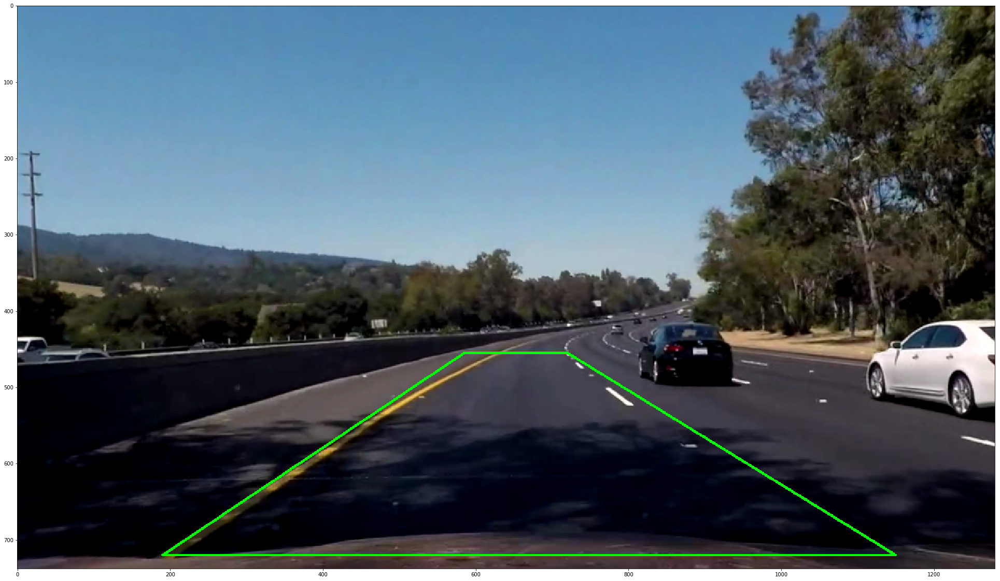

In [8]:
# Crop area to apply bird eye view
index = 3
original = test_images[index][1]
undist = cv2.undistort(original, mtx, dist, None, mtx)

xSize, ySize, _ = undist.shape
copy = undist.copy()

bottomY = 720
topY = 455


left1 = (190, bottomY)
left1_x, left1_y = left1
left2 = (585, topY)
left2_x, left2_y = left2

right1 = (720, topY)
right1_x, right1_y = right1

right2 = (1150, bottomY)
right2_x, right2_y = right2

color = [0, 255, 0]
w = 2
cv2.line(copy, left1, left2, color, w)
cv2.line(copy, left2, right1, color, w)
cv2.line(copy, right1, right2, color, w)
cv2.line(copy, right2, left1, color, w)
fig, ax = plt.subplots(figsize=(40, 20))
ax.imshow(copy)
cv2.imwrite('images/crop_area.png', copy)

True

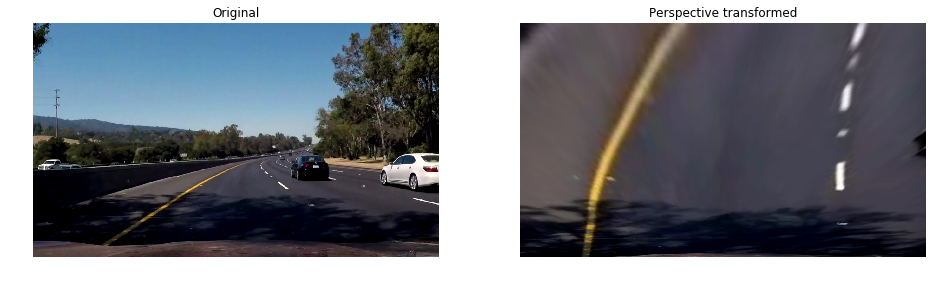

In [9]:
gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
src = np.float32([ 
    [left2_x, left2_y],
    [right1_x, right1_y],
    [right2_x, right2_y],
    [left1_x, left1_y]
])
nX = gray.shape[1]
nY = gray.shape[0]
img_size = (nX, nY)
offset = 200
dst = np.float32([
    [offset, 0],
    [img_size[0]-offset, 0],
    [img_size[0]-offset, img_size[1]], 
    [offset, img_size[1]]
])
img_size = (gray.shape[1], gray.shape[0])
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
warped = cv2.warpPerspective(undist, M, img_size)

show_compare_images(
    original, 'Original',
    warped, 'Perspective transformed'
)
warped = cv2.warpPerspective(undist, M, img_size)
cv2.imwrite('./images/perpective_transform_original.png', original)
cv2.imwrite('./images/perpective_transform_warped.png',warped)

### Use Sobel transform (core function to Canny Edge)

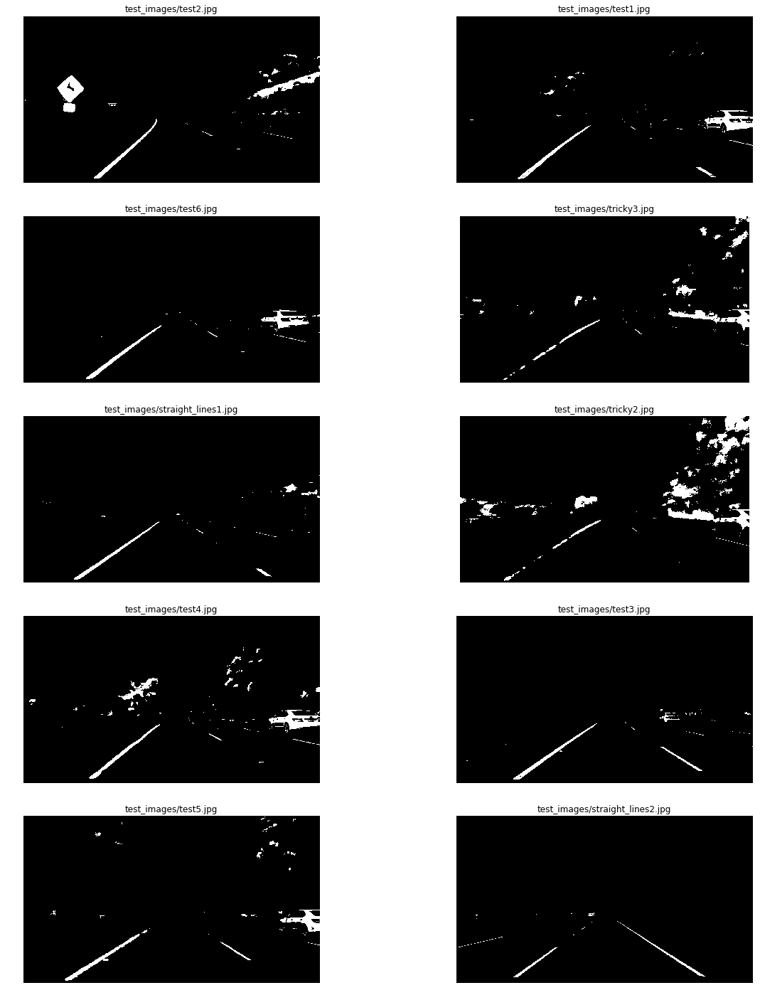

In [10]:
def AdjustPerspective(image, M=M):
    img_size = (image.shape[1], image.shape[0])
    warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

def lab_lthresh(img, thresh=(200, 255)):
    l_channel = img[:,:,0]
    l_channel = l_channel*(255/np.max(l_channel))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(l_channel)
    binary_output[(l_channel > thresh[0]) & (l_channel <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

def hls_lthresh(img, thresh=(220, 255)):
    # 1) Convert to HLS color space
    l_channel = img[:,:,1]
    l_channel = l_channel*(255/np.max(l_channel))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(l_channel)
    binary_output[(l_channel > thresh[0]) & (l_channel <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

def hls_sthresh(img, thresh=(220, 255)):
    # 1) Convert to HLS color space
    s_channel = img[:,:,2]
    s_channel = s_channel*(255/np.max(s_channel))
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

def lab_bthresh(img, thresh=(190,255)):
    # 1) Convert to LAB color space
    b_channel = img[:,:,2]
    # don't normalize if there are no yellows in the image
    if np.max(b_channel) > 175:
        b_channel = b_channel*(255/np.max(b_channel))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(b_channel)
    binary_output[((b_channel > thresh[0]) & (b_channel <= thresh[1]))] = 1
    # 3) Return a binary image of threshold result
    return binary_output

def CombineColorSpaces(original):
    img = np.copy(original)
    img = undistort_image(img)
#     img_l_thresh = lab_lthresh(cv2.cvtColor(img, cv2.COLOR_BGR2LAB))
    img_l_thresh = hls_lthresh(cv2.cvtColor(img, cv2.COLOR_RGB2HLS))
    img_b_thresh = lab_bthresh(cv2.cvtColor(img, cv2.COLOR_RGB2LAB))
    combined = np.zeros_like(img_b_thresh)
    combined[(img_l_thresh == 1) | (img_b_thresh == 1)] = 1
#     combined = hls_sthresh(cv2.cvtColor(img, cv2.COLOR_BGR2HLS))
    return combined

combined_colorspaces = lambda image: CombineColorSpaces(image)
resultCombinedColorspaces = applyActionToImages(test_images, combined_colorspaces)
show_images(resultCombinedColorspaces, 2, 5, (20, 25), cmap='gray')

### Combine color channel and Sobel

In [11]:
s_channel = lambda image: CombineColorSpaces(image)

# Applies a threshold and return binary image
def ApplyThreshold(img, thresh_min, thresh_max):
    binary = np.zeros_like(img)
    binary[(img >= thresh_min) & (img <= thresh_max)] = 1
    return binary

# Calculate the Sobel gradient on the direction `orient` and return a binary thresholded image 
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):
    if orient == 'x':
        yorder = 0
        xorder = 1
    else:
        yorder = 1
        xorder = 0
        
    sobel = cv2.Sobel(img, cv2.CV_64F, xorder, yorder, ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled = np.uint8(255.0*abs_sobel/np.max(abs_sobel))
    return ApplyThreshold(scaled, thresh_min, thresh_max)

In [12]:
# Define lambda sobels
action_sobel_X = lambda img: abs_sobel_thresh(s_channel(img), thresh_min=30, thresh_max=250)
action_sobel_Y = lambda img: abs_sobel_thresh(s_channel(img), orient='y', thresh_min=30, thresh_max=250)

In [13]:
# Combine Sobel X and Y
def combineGradients(img):
    sobel_x = action_sobel_X(img)
    sobel_y = action_sobel_Y(img)
    combined = np.zeros_like(sobel_x) 
    combined[((sobel_x == 1) & (sobel_y == 1))] = 1
    return combined

In [14]:
# combineAndTransform = lambda img: combineGradients(img)
# combineAndTransform = lambda img: AdjustPerspective(CombineColorSpaces(img))
combineAndTransform = lambda img: AdjustPerspective(combineGradients(img))
# resultCombined = applyActionToImages(test_images, combineAndTransform)
# show_images(resultCombined, 2, 5, (20, 25), cmap='gray')

### Define a pipeline

In [15]:
def pipeline(img):
    output = combineAndTransform(img)
    return output

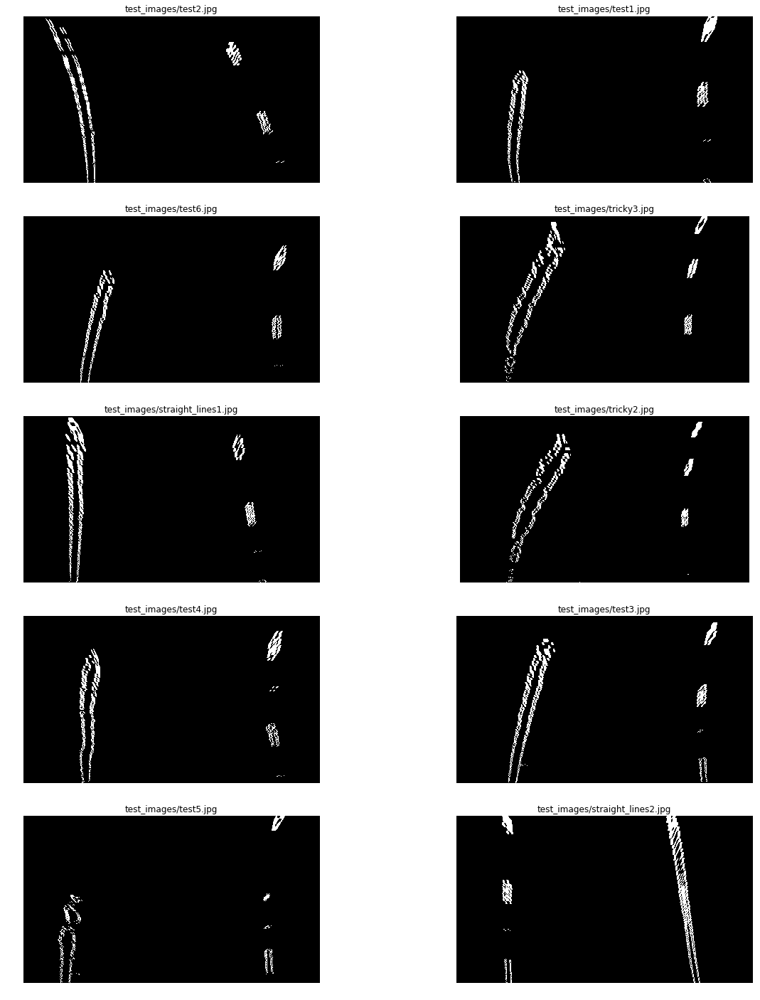

In [16]:
pipeline_lambda = lambda img: pipeline(img)
result_pipeline = applyActionToImages(test_images, pipeline_lambda)
show_images(result_pipeline, 2, 5, (20, 25), cmap='gray')

## Finding lane lines

### Sliding Window Algorithm

In [17]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def sliding_window_polyfit(image, nwindows=10, margin=120, minpix=25):
    binary_warped = image
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    left_fit_m, right_fit_m = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
        left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
        right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    return (left_fit, right_fit, left_fit_m, right_fit_m, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy)

In [18]:
def visualizeLanes(image, ax):
    left_fit, right_fit, left_fit_m, right_fit_m, left_lane_inds, right_lane_inds, out_img, nonzerox, nonzeroy = sliding_window_polyfit(pipeline(image))
    # Visualization
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    ax.imshow(out_img)
    ax.plot(left_fitx, ploty, color='yellow')
    ax.plot(right_fitx, ploty, color='yellow')
    return ( left_fit, right_fit, left_fit_m, right_fit_m )

In [19]:
def showLaneOnImages(images, cols = 2, rows = 5, figsize=(20,25)):
    imgLength = len(images)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    indexes = range(cols * rows)
    imageAndFit = []
    for ax, index in zip(axes.flat, indexes):
        if index < imgLength:
            imagePathName, image = images[index]
            left_fit, right_fit, left_fit_m, right_fit_m = visualizeLanes(image, ax)
            ax.set_title(imagePathName)
            ax.axis('off')
            imageAndFit.append( ( imagePathName, left_fit, right_fit, left_fit_m, right_fit_m ) )
    return imageAndFit

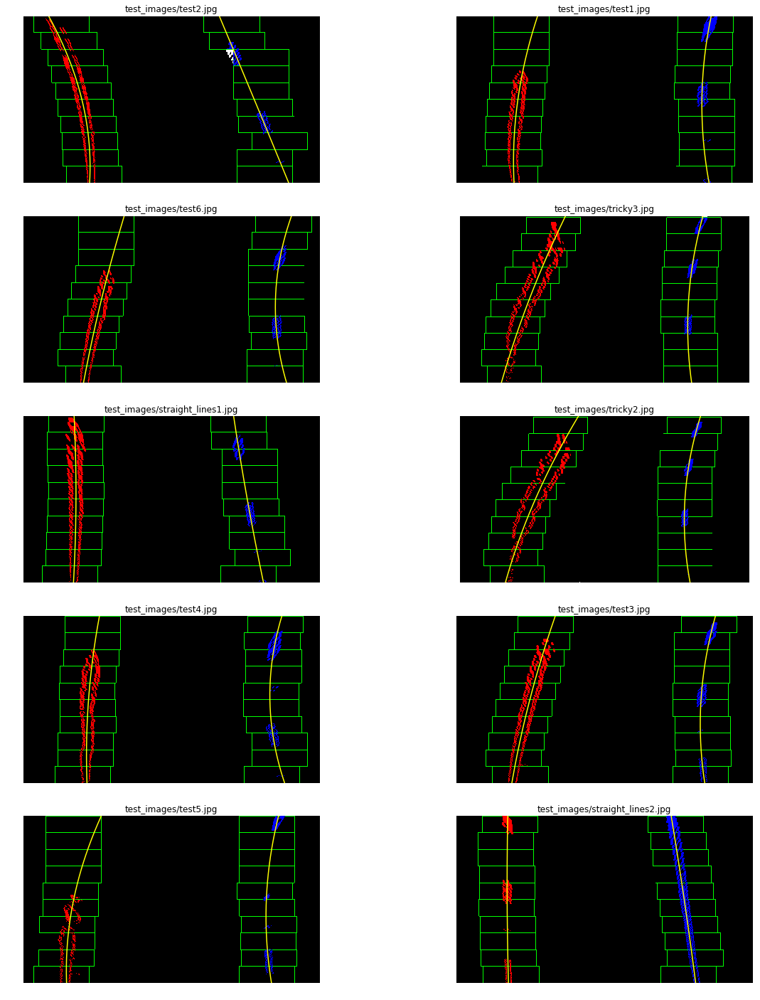

In [20]:
imagesPoly = showLaneOnImages(test_images)

In [21]:
def polyfit_using_prev_fit(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 85
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

### Calculate Curvature

In [22]:
def calculateCurvature(yRange, left_fit_cr):   
    return ((1 + (2*left_fit_cr[0]*yRange*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])

for imagePoly in imagesPoly:
    imagePath, left_fit, right_fit, left_fit_m, right_fit_m = imagePoly
    yRange = 720
    leftCurvature = calculateCurvature(yRange, left_fit_m) / 1000
    rightCurvature = calculateCurvature(yRange, right_fit_m) / 1000
    print('Image : {}, Left : {:.2f} km, Right : {:.2f} km'.format(imagePath, leftCurvature, rightCurvature))
    
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

Image : test_images/test2.jpg, Left : 0.39 km, Right : 19.84 km
Image : test_images/test1.jpg, Left : 0.62 km, Right : 0.60 km
Image : test_images/test6.jpg, Left : 2.05 km, Right : 0.36 km
Image : test_images/tricky3.jpg, Left : 1.22 km, Right : 0.58 km
Image : test_images/straight_lines1.jpg, Left : 2.24 km, Right : 3.89 km
Image : test_images/tricky2.jpg, Left : 0.76 km, Right : 0.49 km
Image : test_images/test4.jpg, Left : 1.06 km, Right : 0.37 km
Image : test_images/test3.jpg, Left : 1.34 km, Right : 0.55 km
Image : test_images/test5.jpg, Left : 0.48 km, Right : 0.57 km
Image : test_images/straight_lines2.jpg, Left : 5.16 km, Right : 6.30 km


### Warp

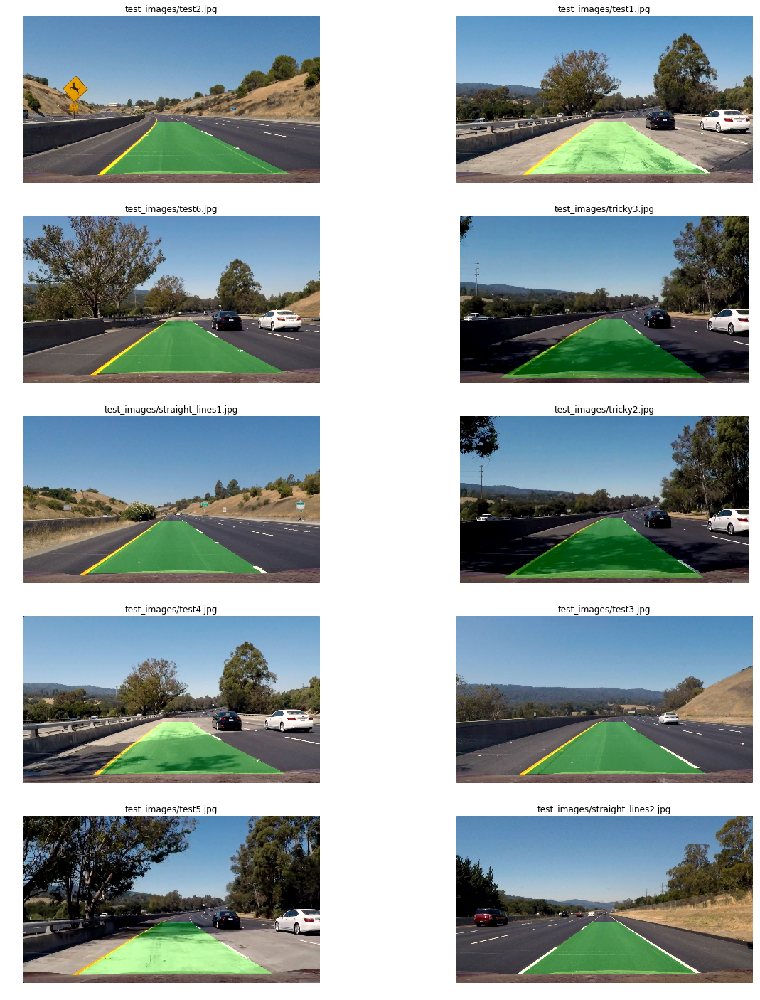

In [23]:
def drawLine(img, left_fit, right_fit):
    yMax = img.shape[0]
    ploty = np.linspace(0, yMax - 1, yMax)
    color_warp = np.zeros_like(img).astype(np.uint8)
    
    # Calculate points.
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    return cv2.addWeighted(img, 1, newwarp, 0.3, 0)

def drawLaneOnImage(img):
    left_fit, right_fit, left_fit_m, right_fit_m, _, _, _, _, _ = sliding_window_polyfit(pipeline(img))
    if left_fit is not None and right_fit is not None:
        output = drawLine(img, left_fit, right_fit)
    else:
        output = img
    return output

resultLines = applyActionToImages(test_images, drawLaneOnImage)
show_images(resultLines, 2, 5, (20, 25), cmap='gray')

cv2.imwrite('./images/draw_lane_on_image.png', resultLines[0][1])

def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    
#     return drawLine(binary_img, l_fit, r_fit)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.3, 0)
    return result

### Draw data

True

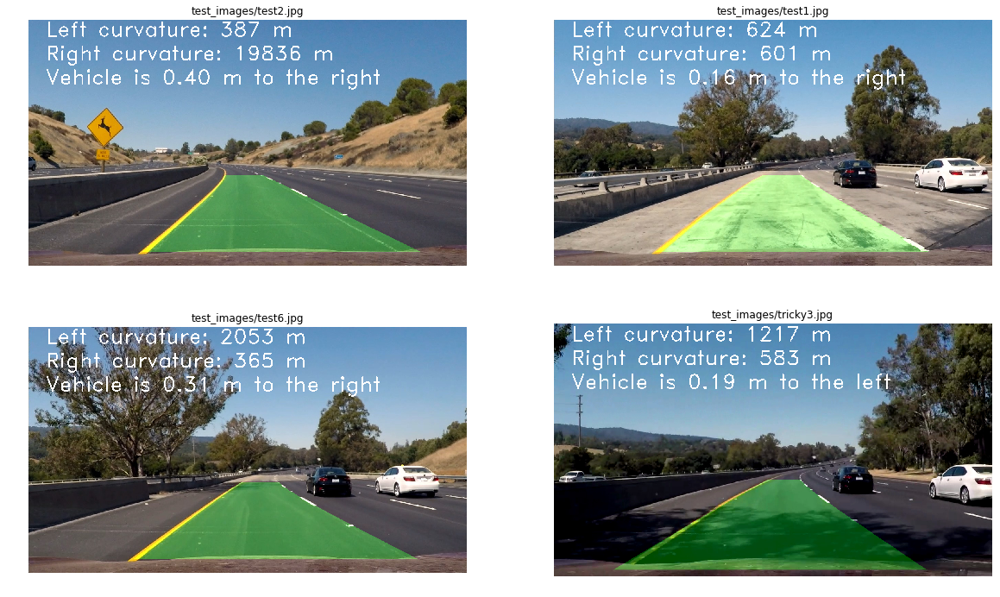

In [24]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

def drawDatapipeline(img, fontScale=2):
    left_fit, right_fit, left_fit_m, right_fit_m, _, _, _, _, _ = sliding_window_polyfit(pipeline(img))
    if left_fit is None or right_fit is None:
        return img

    output = drawLine(img, left_fit, right_fit)
    
    # Calculate curvature
    leftCurvature = calculateCurvature(yRange, left_fit_m) 
    rightCurvature = calculateCurvature(yRange, right_fit_m)
    
    # Calculate vehicle center
    xMax = img.shape[1]*xm_per_pix
    yMax = img.shape[0]*ym_per_pix
    vehicleCenter = xMax / 2
    lineLeft = left_fit_m[0]*yMax**2 + left_fit_m[1]*yMax + left_fit_m[2]
    lineRight = right_fit_m[0]*yMax**2 + right_fit_m[1]*yMax + right_fit_m[2]
    lineMiddle = lineLeft + (lineRight - lineLeft)/2
    diffFromVehicle = lineMiddle - vehicleCenter
    if diffFromVehicle > 0:
        message = '{:.2f} m to the right'.format(diffFromVehicle)
    else:
        message = '{:.2f} m to the left'.format(-diffFromVehicle)
    
    # Draw info
    font = cv2.FONT_HERSHEY_DUPLEX
    fontColor = (255, 255, 255)
    cv2.putText(output, 'Left curvature: {:.0f} m'.format(leftCurvature), (50, 50), font, fontScale, fontColor, 2)
    cv2.putText(output, 'Right curvature: {:.0f} m'.format(rightCurvature), (50, 120), font, fontScale, fontColor, 2)
    cv2.putText(output, 'Vehicle is {}'.format(message), (50, 190), font, fontScale, fontColor, 2)
    return output

resultDisplay = applyActionToImages(test_images, lambda img: drawDatapipeline(img))
show_images(resultDisplay, 2, 2, (20, 12), cmap='gray')
cv2.imwrite('./images/draw_lane_on_image_and_text.png', resultDisplay[0][1])

### Create a video using the output images

In [25]:
class Lane():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

In [33]:
from moviepy.editor import VideoFileClip
i = 0

def process_image(img):
    new_img = np.copy(img)
    img_bin = pipeline(new_img)
    
    global i
    i = i + 1
    if i % 100 == 0:
        normalized_img_bin = np.dstack((img_bin, img_bin, img_bin))*255
        cv2.imwrite('./tmp/imgtmp.jpg', normalized_img_bin)

    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, _, _, l_lane_inds, r_lane_inds, _, _ ,_ = sliding_window_polyfit(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_using_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(img_bin, l_line.best_fit, r_line.best_fit, l_lane_inds, r_lane_inds)
        img_out = draw_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
    
    diagnostic_output = True
    if diagnostic_output:
        # put together multi-view output
        diag_img = np.zeros((720,1280,3), dtype=np.uint8)
        
        # original output (top left)
        diag_img[0:360,0:640,:] = cv2.resize(img_out,(640,360))
        
        # binary overhead view (top right)
        img_bin = np.dstack((img_bin*255, img_bin*255, img_bin*255))
        resized_img_bin = cv2.resize(img_bin,(640,360))
        diag_img[0:360,640:1280, :] = resized_img_bin
        
        # overhead with all fits added (bottom right)
        img_bin_fit = np.copy(img_bin)
        for i, fit in enumerate(l_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (20*i+100,0,20*i+100))
        for i, fit in enumerate(r_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (0,20*i+100,20*i+100))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, l_line.best_fit, (255,255,0))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, r_line.best_fit, (255,255,0))
        diag_img[360:720,640:1280,:] = cv2.resize(img_bin_fit,(640,360))
        
        # diagnostic data (bottom left)
        color_ok = (200,255,155)
        color_bad = (255,155,155)
        font = cv2.FONT_HERSHEY_DUPLEX
        if l_fit is not None:
            text = 'This fit L: ' + ' {:0.6f}'.format(l_fit[0]) + \
                                    ' {:0.6f}'.format(l_fit[1]) + \
                                    ' {:0.6f}'.format(l_fit[2])
        else:
            text = 'This fit L: None'
        cv2.putText(diag_img, text, (40,380), font, .5, color_ok, 1, cv2.LINE_AA)
        if r_fit is not None:
            text = 'This fit R: ' + ' {:0.6f}'.format(r_fit[0]) + \
                                    ' {:0.6f}'.format(r_fit[1]) + \
                                    ' {:0.6f}'.format(r_fit[2])
        else:
            text = 'This fit R: None'

        if l_line.best_fit is not None:
            cv2.putText(diag_img, text, (40,400), font, .5, color_ok, 1, cv2.LINE_AA)
            text = 'Best fit L: ' + ' {:0.6f}'.format(l_line.best_fit[0]) + \
                                    ' {:0.6f}'.format(l_line.best_fit[1]) + \
                                    ' {:0.6f}'.format(l_line.best_fit[2])
        if r_line.best_fit is not None:
            cv2.putText(diag_img, text, (40,440), font, .5, color_ok, 1, cv2.LINE_AA)
            text = 'Best fit R: ' + ' {:0.6f}'.format(r_line.best_fit[0]) + \
                                    ' {:0.6f}'.format(r_line.best_fit[1]) + \
                                    ' {:0.6f}'.format(r_line.best_fit[2])
        cv2.putText(diag_img, text, (40,460), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Diffs L: ' + ' {:0.6f}'.format(l_line.diffs[0]) + \
                             ' {:0.6f}'.format(l_line.diffs[1]) + \
                             ' {:0.6f}'.format(l_line.diffs[2])
        if l_line.diffs[0] > 0.001 or \
           l_line.diffs[1] > 1.0 or \
           l_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,500), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Diffs R: ' + ' {:0.6f}'.format(r_line.diffs[0]) + \
                             ' {:0.6f}'.format(r_line.diffs[1]) + \
                             ' {:0.6f}'.format(r_line.diffs[2])
        if r_line.diffs[0] > 0.001 or \
           r_line.diffs[1] > 1.0 or \
           r_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,520), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Good fit count L:' + str(len(l_line.current_fit))
        cv2.putText(diag_img, text, (40,560), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Good fit count R:' + str(len(r_line.current_fit))
        cv2.putText(diag_img, text, (40,580), font, .5, color_ok, 1, cv2.LINE_AA)
        
        img_out = diag_img
    return img_out


In [34]:
def plot_fit_onto_img(img, fit, plot_color):
    if fit is None:
        return img
    new_img = np.copy(img)
    h = new_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    plotx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
    pts = np.array([np.transpose(np.vstack([plotx, ploty]))])
    cv2.polylines(new_img, np.int32([pts]), isClosed=False, color=plot_color, thickness=8)
    return new_img

In [39]:
l_line = Lane()
r_line = Lane()
cv2.imwrite('./tmp/proctmp.jpg', cv2.cvtColor(process_image(test_images[0][1]), cv2.COLOR_BGR2RGB))

True

### Project Video

In [36]:
video_output1 = './output_video/project_video.mp4'
video_input1 = VideoFileClip('project_video.mp4').subclip(0,10)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video ./output_video/project_video.mp4
[MoviePy] Writing video ./output_video/project_video.mp4



 62%|██████▏   | 155/251 [00:32<00:18,  5.15it/s]


100%|█████████▉| 250/251 [00:52<00:00,  4.59it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_video/project_video.mp4 

CPU times: user 2min 4s, sys: 1.57 s, total: 2min 6s
Wall time: 52.6 s
